# **Business Understanding**

About Dataset

Context

Bob has started his own mobile company. He wants to give tough fight to big companies like Apple,Samsung etc.

He does not know how to estimate price of mobiles his company creates. In this competitive mobile phone market you cannot simply assume things. To solve this problem he collects sales data of mobile phones of various companies.

Bob wants to find out some relation between features of a mobile phone(eg:- RAM,Internal Memory etc) and its selling price. But he is not so good at Machine Learning. So he needs your help to solve this problem.

In this problem you do not have to predict actual price but a price range indicating how high the price is

# **Data understanding**

In [ ]:
!pip install ydata-profiling

In [ ]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from ydata_profiling import ProfileReport
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
from sklearn.preprocessing import StandardScaler
from sklearn.ensemble import RandomForestClassifier
from sklearn.feature_selection import mutual_info_classif
from sklearn.svm import SVC
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import f1_score
from sklearn.metrics import classification_report, ConfusionMatrixDisplay
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.model_selection import StratifiedKFold
from sklearn.neural_network import MLPClassifier
from matplotlib.colors import LinearSegmentedColormap


import warnings
warnings.filterwarnings("ignore")

In [ ]:
df = pd.read_csv('/content/train.csv')
df.head()

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
0,842,0,2.2,0,1,0,7,0.6,188,2,...,20,756,2549,9,7,19,0,0,1,1
1,1021,1,0.5,1,0,1,53,0.7,136,3,...,905,1988,2631,17,3,7,1,1,0,2
2,563,1,0.5,1,2,1,41,0.9,145,5,...,1263,1716,2603,11,2,9,1,1,0,2
3,615,1,2.5,0,0,0,10,0.8,131,6,...,1216,1786,2769,16,8,11,1,0,0,2
4,1821,1,1.2,0,13,1,44,0.6,141,2,...,1208,1212,1411,8,2,15,1,1,0,1


In [ ]:
df.columns

Index(['battery_power', 'blue', 'clock_speed', 'dual_sim', 'fc', 'four_g',
       'int_memory', 'm_dep', 'mobile_wt', 'n_cores', 'pc', 'px_height',
       'px_width', 'ram', 'sc_h', 'sc_w', 'talk_time', 'three_g',
       'touch_screen', 'wifi', 'price_range'],
      dtype='object')

We need a more in-depth understanding of our features to interpret them accurately before constructing a model. Therefore, I provide descriptions for the columns in the dataset:

1. battery_power: The battery capacity of the mobile phone.
2. blue: Whether the phone supports Bluetooth (binary variable, possibly 0 or 1).
3. clock_speed: The clock speed of the mobile phone's processor.
4. dual_sim: Whether the phone supports dual SIM cards (binary variable).
5. fc: Front Camera megapixels.
6. four_g: Whether the phone supports 4G connectivity (binary variable).
7. int_memory: Internal memory (RAM) of the device.
8. m_dep: Mobile depth in cm.
9. mobile_wt: Weight of the mobile phone.
10. n_cores: Number of processor cores.
11. pc: Primary Camera megapixels.
12. px_height: Pixel resolution height of the phone's display.
13. px_width: Pixel resolution width of the phone's display.
14. ram: Random Access Memory (RAM) of the device.
15. sc_h: Screen height of the mobile phone in cm.
16. sc_w: Screen width of the mobile phone in cm.
17. talk_time: Maximum talk time supported by the phone's battery.
18. three_g: Whether the phone supports 3G connectivity (binary variable).
19. touch_screen: Whether the phone has a touch screen (binary variable).
20. wifi: Whether the phone supports Wi-Fi connectivity (binary variable).
21. price_range: The target variable indicating the price range of the mobile phone.





Now let's explore our data

In [ ]:
df.shape

(2000, 21)

In [ ]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2000 entries, 0 to 1999
Data columns (total 21 columns):
 #   Column         Non-Null Count  Dtype  
---  ------         --------------  -----  
 0   battery_power  2000 non-null   int64  
 1   blue           2000 non-null   int64  
 2   clock_speed    2000 non-null   float64
 3   dual_sim       2000 non-null   int64  
 4   fc             2000 non-null   int64  
 5   four_g         2000 non-null   int64  
 6   int_memory     2000 non-null   int64  
 7   m_dep          2000 non-null   float64
 8   mobile_wt      2000 non-null   int64  
 9   n_cores        2000 non-null   int64  
 10  pc             2000 non-null   int64  
 11  px_height      2000 non-null   int64  
 12  px_width       2000 non-null   int64  
 13  ram            2000 non-null   int64  
 14  sc_h           2000 non-null   int64  
 15  sc_w           2000 non-null   int64  
 16  talk_time      2000 non-null   int64  
 17  three_g        2000 non-null   int64  
 18  touch_sc

In [ ]:
df.describe().T

,count,mean,std,min,25%,50%,75%,max
battery_power,2000.0,1238.51850,439.418206,501.0,851.75,1226.0,1615.25,1998.0
blue,2000.0,0.49500,0.500100,0.0,0.00,0.0,1.00,1.0
clock_speed,2000.0,1.52225,0.816004,0.5,0.70,1.5,2.20,3.0
dual_sim,2000.0,0.50950,0.500035,0.0,0.00,1.0,1.00,1.0
fc,2000.0,4.30950,4.341444,0.0,1.00,3.0,7.00,19.0
four_g,2000.0,0.52150,0.499662,0.0,0.00,1.0,1.00,1.0
int_memory,2000.0,32.04650,18.145715,2.0,16.00,32.0,48.00,64.0
m_dep,2000.0,0.50175,0.288416,0.1,0.20,0.5,0.80,1.0
mobile_wt,2000.0,140.24900,35.399655,80.0,109.00,141.0,170.00,200.0
n_cores,2000.0,4.52050,2.287837,1.0,3.00,4.0,7.00,8.0


In [ ]:
df.nunique()

battery_power    1094
blue                2
clock_speed        26
dual_sim            2
fc                 20
four_g              2
int_memory         63
m_dep              10
mobile_wt         121
n_cores             8
pc                 21
px_height        1137
px_width         1109
ram              1562
sc_h               15
sc_w               19
talk_time          19
three_g             2
touch_screen        2
wifi                2
price_range         4
dtype: int64

In [ ]:
df.duplicated().sum()

0

In [ ]:
df.isnull().sum()

battery_power    0
blue             0
clock_speed      0
dual_sim         0
fc               0
four_g           0
int_memory       0
m_dep            0
mobile_wt        0
n_cores          0
pc               0
px_height        0
px_width         0
ram              0
sc_h             0
sc_w             0
talk_time        0
three_g          0
touch_screen     0
wifi             0
price_range      0
dtype: int64

# **Conclusions:**

This dataset contains information from 2000 mobile phones.
We have 21 variables including 20 independent variables and 1 dependent variable which is price_range.
We have 8 categorical variables: n_cores , price_range, blue, dual_sim, four_g, three_g, touch_screen, wifi
We have 13 numeric variables: battery_power, clock_speed, fc, int_memory, m_dep, mobile_wt, pc, px_height, px_width, ram, talk_time, sc_h, sc_w

We see that our dataset has no missing and duplicated values. In addition all of our categorical data is already encoded, therefore we don't need to perform any encoding technic and handle missing values and duplicates.



# **EDA**

In [ ]:
proile = ProfileReport(df)
proile.to_notebook_iframe()

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

# **Conclusions:**

* Mobile phones are divided with exactly the same frequency across the 4 price_range classes. Therefore, the dataset is completely balanced.
* The mobile phones in the data set have almost the same frequency in terms of having or not having Bluetooth, 4G, touch screen, Wifi as well as supporting two SIM cards or not and the number of processing cores used.
* Around 76% of the mobile phones support 3G.
* RAM is higly correlated with price_range
* three_g is higly correlated with four_g, intuitively we can say that if phone support 4G, then it also supports 3G
* pc(Primary Camera megapixels) is higly correlated with fc (Front Camera megapixels), what can lead us to create some feature like total_camera_pixels  = pc + fc
* In some features, including px_height (Pixel Resolution Height), fc ( Front Camera megapixels
) and sc_w (Screen Width of mobile in cm), many values close to zero are observed, which seem like noise! Also some values of pc, fc, sc_w are equal to zero, what look suspicious, so we need to discover it.


### Exploring pixel resolution height, screen_width, both primary and  front cameras.

### Primary and front cameras

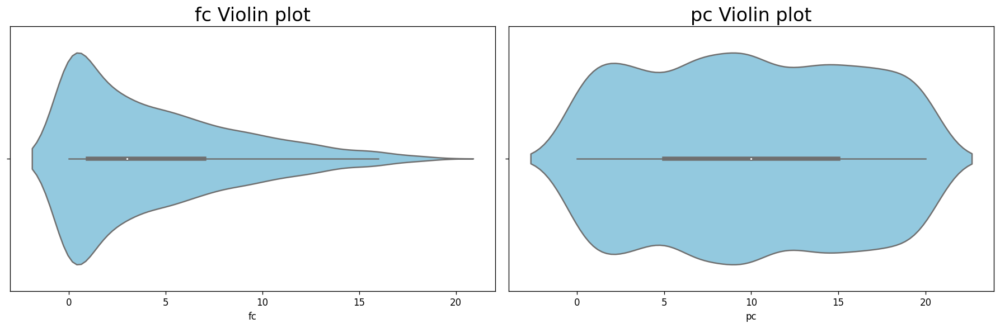

In [ ]:
fig, ax = plt.subplots(1, 2, figsize=(15, 5), dpi=120)

sns.violinplot(x='fc', data=df, color='skyblue', ax=ax[0])
ax[0].set_title('fc Violin plot', fontsize=20)

sns.violinplot(x='pc', data=df, color='skyblue', ax=ax[1])
ax[1].set_title('pc Violin plot', fontsize=20)

plt.tight_layout()

plt.show()

In [ ]:
df.loc[df['fc'] == 0]

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
1,1021,1,0.5,1,0,1,53,0.7,136,3,...,905,1988,2631,17,3,7,1,1,0,2
3,615,1,2.5,0,0,0,10,0.8,131,6,...,1216,1786,2769,16,8,11,1,0,0,2
7,1954,0,0.5,1,0,0,24,0.8,187,4,...,512,1149,700,16,3,5,1,1,1,0
8,1445,1,0.5,0,0,0,53,0.7,174,7,...,386,836,1099,17,1,20,1,0,0,0
10,769,1,2.9,1,0,0,9,0.1,182,5,...,248,874,3946,5,2,7,0,0,0,3
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1971,538,0,1.1,1,0,1,25,0.3,163,7,...,455,537,2215,9,3,17,1,1,1,1
1984,797,0,2.2,1,0,0,37,0.9,144,7,...,206,1167,2216,9,5,6,1,0,0,1
1993,1467,1,0.5,0,0,0,18,0.6,122,5,...,888,1099,3962,15,11,5,1,1,1,3
1995,794,1,0.5,1,0,1,2,0.8,106,6,...,1222,1890,668,13,4,19,1,1,0,0


In [ ]:
df.loc[df['pc'] == 0]

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
7,1954,0,0.5,1,0,0,24,0.8,187,4,...,512,1149,700,16,3,5,1,1,1,0
33,1310,1,2.2,1,0,1,51,0.6,100,4,...,178,1919,3845,7,0,12,1,1,0,3
52,1654,1,1.5,1,0,1,43,0.3,109,2,...,546,629,3112,12,5,10,1,1,0,3
54,1073,1,0.5,1,0,0,51,0.5,145,7,...,690,804,2908,6,0,18,0,1,0,2
62,1156,1,1.2,1,0,1,50,0.8,159,2,...,322,547,470,7,0,15,1,1,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1906,1807,0,0.8,1,0,1,38,0.2,97,8,...,1332,1814,1069,7,6,7,1,0,0,1
1911,1259,0,1.2,1,0,0,13,0.5,97,2,...,1210,1989,340,17,13,4,1,0,1,0
1931,1854,0,0.9,1,0,1,33,0.4,195,1,...,665,718,1675,14,12,9,1,0,1,1
1968,1667,0,1.0,1,0,1,21,0.9,138,2,...,1211,1396,635,17,7,15,1,0,0,0


I initially considered the possibility that we were dealing with old phones lacking built-in cameras. However, upon reviewing our data, this notion seems improbable. The introduction of 4G support and other features coincided with the evolution of mobile phones into smartphones. Smartphones are designed as multifunctional devices, and cameras have become a standard feature on most models. This observation leads me to consider the idea of imputing zeros with the mean/median value as a reasonable approach. However, due to our limited expertise in this market and the wide variety of mobile phone brands and models, a more in-depth investigation is required to better understand this issue.

### Pixel Resolution Height and Screen Width of mobile in cm

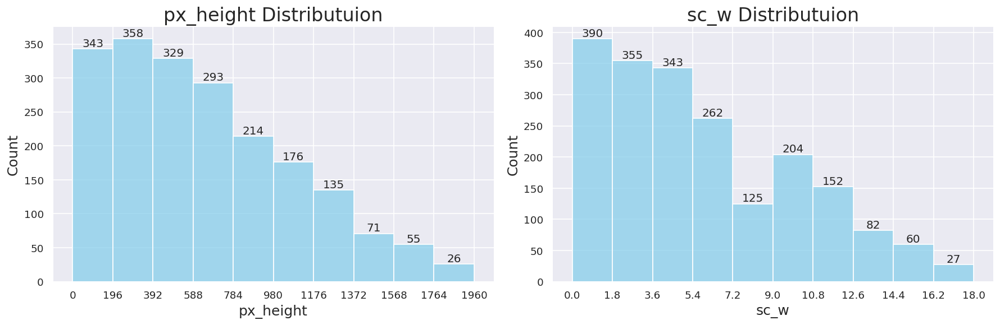

In [ ]:
sns.set(rc = {'axes.labelsize' : 15})
fig, ax = plt.subplots(1, 2, figsize=(15,5), dpi=120)

_, bin_edges = np.histogram(df['px_height'], range=(np.floor(df['px_height'].min()), np.ceil(df['px_height'].max())))
graph1 = sns.histplot(x='px_height', data=df, bins=bin_edges, color='skyblue', ax=ax[0])
ax[0].set_xticks(np.round(bin_edges,1))
ax[0].set_title('px_height Distributuion', fontsize=20)
for cont in graph1.containers:
        graph1.bar_label(cont)

_, bin_edges = np.histogram(df['sc_w'], range=(np.floor(df['sc_w'].min()), np.ceil(df['sc_w'].max())))
graph2 = sns.histplot(x='sc_w', data=df, bins=bin_edges, color='skyblue', ax=ax[1])
ax[1].set_xticks(np.round(bin_edges,1))
ax[1].set_title('sc_w Distributuion', fontsize=20)
for cont in graph2.containers:
        graph2.bar_label(cont)

plt.tight_layout()
plt.show()

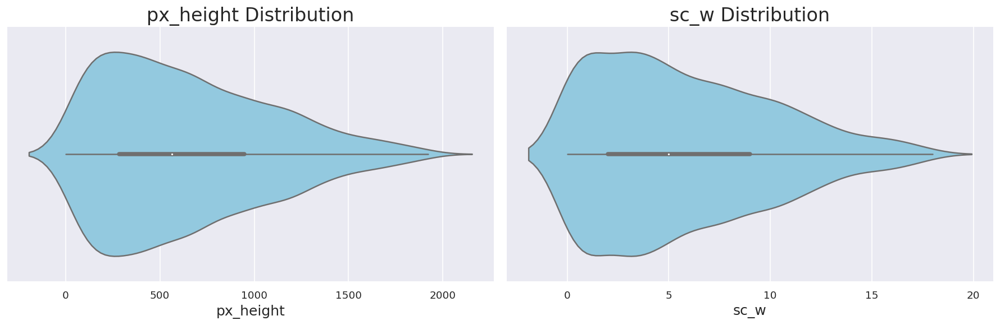

In [ ]:
sns.set(rc={'axes.labelsize': 15})

fig, ax = plt.subplots(1, 2, figsize=(15, 5), dpi=120)

sns.violinplot(x='px_height', data=df, color='skyblue', ax=ax[0])
ax[0].set_title('px_height Distribution', fontsize=20)

sns.violinplot(x='sc_w', data=df, color='skyblue', ax=ax[1])
ax[1].set_title('sc_w Distribution', fontsize=20)

plt.tight_layout()

plt.show()

As observed, the variables px_height (Pixel Resolution Height) and sc_w (Screen Width of the mobile in cm) exhibit numerous values of zero and values close to zero, resembling noise. However, due to our limited expertise in this domain, establishing a definitive lower limit for acceptable values in these features proves challenging. In our investigation, we discovered that:

* Some of the earliest commercially available mobile phones, such as the
* Motorola DynaTAC 8000X, featured a screen resolution of only 5 pixels in height.
* Early mobile phones with screens had a width of around 2-3 centimeters.

Nevertheless, upon closer examination of our dataset, we identified instances displaying characteristics consistent with new mobile phones, which were not present in older models.

# **Conclusions:**
We have identified certain examples that appear to be noise, along with features exhibiting outliers (px_height, fc, sc_w). To address these anomalies accurately, it is imperative to conduct bivariate analysis. This analysis will help us comprehend the dependency of these features on others, enabling us to either substantiate our hypothesis regarding older mobile phones and incorrect values or to dismiss them as outliers.

# **Bivariate Analysis**

I believe it would be informative to examine the distributions of our 'problematic' features against the distribution of price ranges. This exploration might provide insight into whether cheaper phones tend to lack certain features, such as cameras. Additionally, I have selected 'four_g' and 'touch_screen' as features to investigate. Analyzing these features could help us gain insights into the novelty of the phones in our dataset, either supporting or refuting our hypothesis.

In [ ]:
Num_Features = df[['sc_w', 'px_height', 'fc']].columns

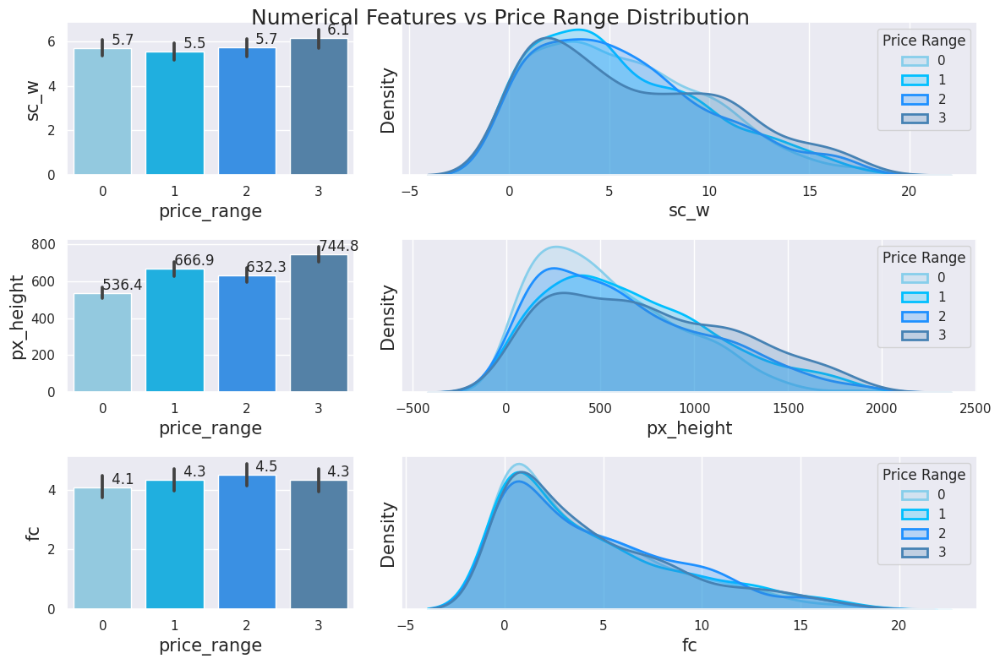

In [ ]:
Target = 'price_range'

sns.set_palette(["#87CEEB", "#00BFFF", "#1E90FF", "#4682B4"])

fig, ax = plt.subplots(3, 2, figsize=(12,8), gridspec_kw={'width_ratios': [1, 2]})

for i,col in enumerate(Num_Features):
    graph = sns.barplot(data=df, x=Target, y=col, ax=ax[i,0])

    sns.kdeplot(data=df[df[Target]==0], x=col, fill=True, linewidth=2, ax=ax[i,1], label='0')
    sns.kdeplot(data=df[df[Target]==1], x=col, fill=True, linewidth=2, ax=ax[i,1], label='1')
    sns.kdeplot(data=df[df[Target]==2], x=col, fill=True, linewidth=2, ax=ax[i,1], label='2')
    sns.kdeplot(data=df[df[Target]==3], x=col, fill=True, linewidth=2, ax=ax[i,1], label='3')
    ax[i,1].set_yticks([])
    ax[i,1].legend(title='Price Range', loc='upper right')

    for cont in graph.containers:
        graph.bar_label(cont, fmt='         %.1f')

for i in range(len(ax)):
    for j in range(len(ax[i])):
        ax[i,j].set_xlabel(ax[i,j].get_xlabel(), fontsize=15)
        ax[i,j].set_ylabel(ax[i,j].get_ylabel(), fontsize=15)

plt.suptitle('Numerical Features vs Price Range Distribution', fontsize=18)
plt.tight_layout()
plt.subplots_adjust(top=0.96)
plt.show()

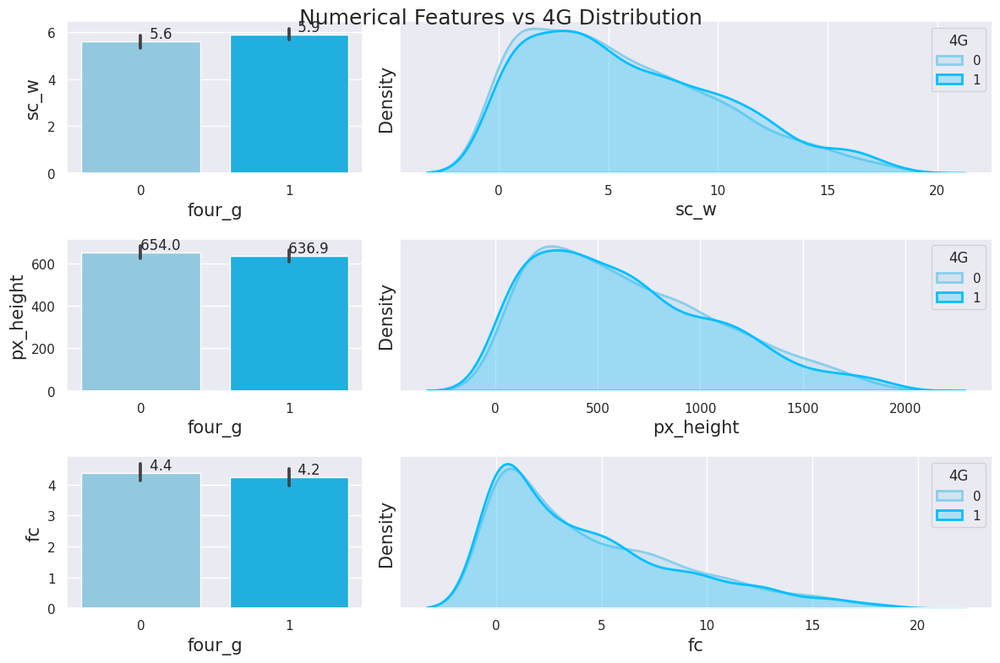

In [ ]:
Target = 'four_g'

sns.set_palette(["#87CEEB", "#00BFFF", "#1E90FF", "#4682B4"])

fig, ax = plt.subplots(3, 2, figsize=(12,8), gridspec_kw={'width_ratios': [1, 2]})

for i,col in enumerate(Num_Features):

    graph = sns.barplot(data=df, x=Target, y=col, ax=ax[i,0])

    sns.kdeplot(data=df[df[Target]==0], x=col, fill=True, linewidth=2, ax=ax[i,1], label='0')
    sns.kdeplot(data=df[df[Target]==1], x=col, fill=True, linewidth=2, ax=ax[i,1], label='1')

    ax[i,1].set_yticks([])
    ax[i,1].legend(title='4G', loc='upper right')

    for cont in graph.containers:
        graph.bar_label(cont, fmt='         %.1f')

for i in range(len(ax)):
    for j in range(len(ax[i])):
        ax[i,j].set_xlabel(ax[i,j].get_xlabel(), fontsize=15)
        ax[i,j].set_ylabel(ax[i,j].get_ylabel(), fontsize=15)

plt.suptitle('Numerical Features vs 4G Distribution', fontsize=18)
plt.tight_layout()
plt.subplots_adjust(top=0.96)
plt.show()

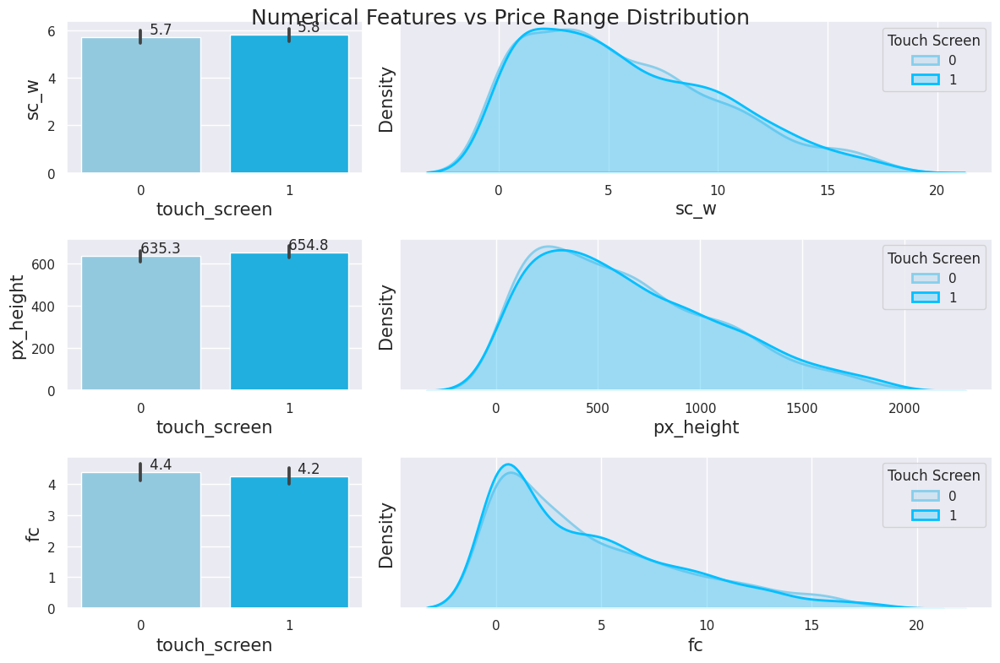

In [ ]:
Target = 'touch_screen'

sns.set_palette(["#87CEEB", "#00BFFF", "#1E90FF", "#4682B4"])

fig, ax = plt.subplots(3, 2, figsize=(12,8), gridspec_kw={'width_ratios': [1, 2]})

for i,col in enumerate(Num_Features):

    graph = sns.barplot(data=df, x=Target, y=col, ax=ax[i,0])

    sns.kdeplot(data=df[df[Target]==0], x=col, fill=True, linewidth=2, ax=ax[i,1], label='0')
    sns.kdeplot(data=df[df[Target]==1], x=col, fill=True, linewidth=2, ax=ax[i,1], label='1')

    ax[i,1].set_yticks([])
    ax[i,1].legend(title='Touch Screen', loc='upper right')

    for cont in graph.containers:
        graph.bar_label(cont, fmt='         %.1f')


for i in range(len(ax)):
    for j in range(len(ax[i])):
        ax[i,j].set_xlabel(ax[i,j].get_xlabel(), fontsize=15)
        ax[i,j].set_ylabel(ax[i,j].get_ylabel(), fontsize=15)

plt.suptitle('Numerical Features vs Price Range Distribution', fontsize=18)
plt.tight_layout()
plt.subplots_adjust(top=0.96)
plt.show()

# **Conclusions:**

We observe nearly identical distributions even after dividing our examples into different cohorts. This suggests that our data may exhibit characteristics of normally distributed noise.

Now, to address these findings, I propose a strategy involving the testing of new features, as we discussed earlier. Additionally, we will explore various approaches for handling the identified noise, including dropping those examples, imputing with mean/median values, or simply ignoring them. Our next step involves building models to assess and determine the most effective strategy. Let's proceed with feature engineering and model development to gain insights into what performs best.

# **Feature Engineering**

In [ ]:
df_f = df.copy()

## Mathematical Transformations

In [ ]:
df_f['sc_size'] = df_f['sc_h'] * df_f['sc_w']
df_f['px_resolution'] = df_f['px_height'] * df_f['px_width']
df_f['pc_total'] = df_f['pc'] + df_f['fc']
df_f['novelty'] = np.where((df['four_g'] == 1) & (df['touch_screen'] == 1), 1, 0)

## Group Transforms

In [ ]:
df

,battery_power,blue,clock_speed,dual_sim,fc,four_g,int_memory,m_dep,mobile_wt,n_cores,...,px_height,px_width,ram,sc_h,sc_w,talk_time,three_g,touch_screen,wifi,price_range
0,842,0,2.2,0,1,0,7,0.6,188,2,...,20,756,2549,9,7,19,0,0,1,1
1,1021,1,0.5,1,0,1,53,0.7,136,3,...,905,1988,2631,17,3,7,1,1,0,2
2,563,1,0.5,1,2,1,41,0.9,145,5,...,1263,1716,2603,11,2,9,1,1,0,2
3,615,1,2.5,0,0,0,10,0.8,131,6,...,1216,1786,2769,16,8,11,1,0,0,2
4,1821,1,1.2,0,13,1,44,0.6,141,2,...,1208,1212,1411,8,2,15,1,1,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1995,794,1,0.5,1,0,1,2,0.8,106,6,...,1222,1890,668,13,4,19,1,1,0,0
1996,1965,1,2.6,1,0,0,39,0.2,187,4,...,915,1965,2032,11,10,16,1,1,1,2
1997,1911,0,0.9,1,1,1,36,0.7,108,8,...,868,1632,3057,9,1,5,1,1,0,3
1998,1512,0,0.9,0,4,1,46,0.1,145,5,...,336,670,869,18,10,19,1,1,1,0


In [ ]:
df_f["AverageScreenWidth"] = (
    df_f.groupby("int_memory")
    ["sc_w"]
    .transform("mean")
)
df_f["AveragePC"] = (
    df_f.groupby("int_memory")
    ["pc"]
    .transform("mean")
)
df_f["AverageFC"] = (
    df_f.groupby("int_memory")
    ["fc"]
    .transform("mean")
)

## Imputing values

In [ ]:
df_f['sc_w_replaced_zeros'] = np.where(df_f['sc_w'] == 0, df_f['sc_w'].mean(), df_f['sc_w'])
df_f['pc_replaced_zeros'] = np.where(df_f['pc'] == 0, df_f['pc'].mean(), df_f['pc'])
df_f['fc_replaced_zeros'] = np.where(df_f['fc'] == 0, df_f['fc'].mean(), df_f['fc'])
df_f['px_height_replaced_zeros'] = np.where(df_f['px_height'] == 0, df_f['px_height'].mean(), df_f['px_height'])

In [ ]:
df.columns

Index(['battery_power', 'blue', 'clock_speed', 'dual_sim', 'fc', 'four_g',
       'int_memory', 'm_dep', 'mobile_wt', 'n_cores', 'pc', 'px_height',
       'px_width', 'ram', 'sc_h', 'sc_w', 'talk_time', 'three_g',
       'touch_screen', 'wifi', 'price_range'],
      dtype='object')

In [ ]:
math_transforms_cols = ['sc_size', 'px_resolution', 'pc_total', 'novelty','battery_power', 'blue', 'clock_speed', 'dual_sim', 'four_g',
       'int_memory', 'm_dep', 'mobile_wt', 'n_cores',  'ram',  'talk_time', 'three_g','touch_screen', 'wifi']

group_transforms_cols = ['battery_power', 'blue', 'clock_speed', 'dual_sim', 'fc', 'four_g', 'int_memory', 'm_dep', 'mobile_wt', 'n_cores', 'pc', 'px_height',
       'px_width', 'ram', 'sc_h', 'sc_w', 'talk_time', 'three_g','touch_screen', 'wifi', 'AverageScreenWidth', 'AveragePC', 'AverageFC']

imputed_cols = ['sc_w_replaced_zeros', 'pc_replaced_zeros', 'fc_replaced_zeros', 'px_height_replaced_zeros', 'battery_power', 'blue', 'clock_speed', 'dual_sim',  'four_g',
              'int_memory', 'm_dep', 'mobile_wt', 'n_cores',  'px_width', 'ram', 'sc_h',  'talk_time', 'three_g', 'touch_screen', 'wifi']

## Feature Importance

In [ ]:
X = df.copy()
y = X.pop("price_range")

discrete_features = X.dtypes == int

In [ ]:
def make_mi_scores(X, y, discrete_features):
    mi_scores = mutual_info_classif(X, y, discrete_features=discrete_features)
    mi_scores = pd.Series(mi_scores, name="MI Scores", index=X.columns)
    mi_scores = mi_scores.sort_values(ascending=False)
    return mi_scores

mi_scores = make_mi_scores(X, y, discrete_features)
mi_scores[::3]

ram            1.281758
px_width       0.881043
sc_w           0.021212
m_dep          0.014609
clock_speed    0.006205
four_g         0.000795
dual_sim       0.000322
Name: MI Scores, dtype: float64

<Figure size 800x500 with 0 Axes>

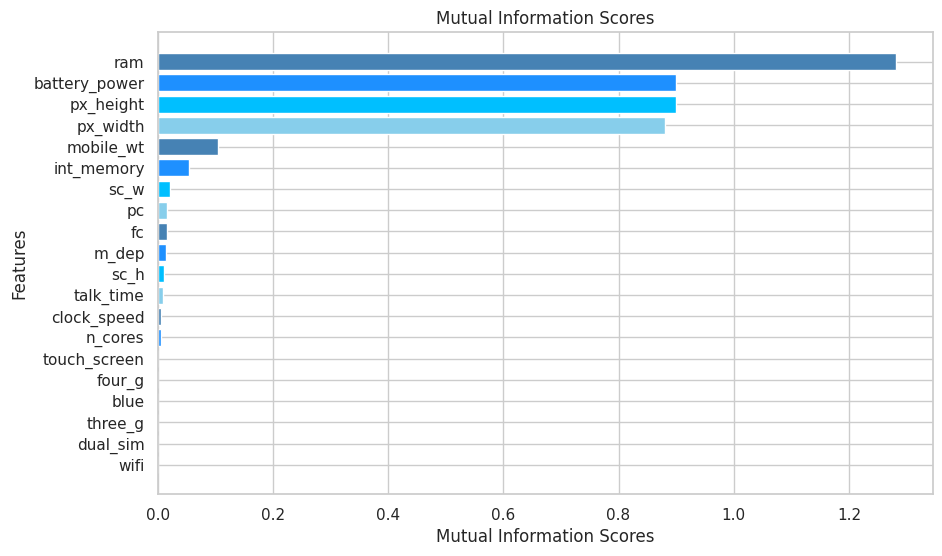

In [ ]:
def plot_mi_scores(scores):

    sns.set(style="whitegrid")
    sns.set_palette(["#87CEEB", "#00BFFF", "#1E90FF", "#4682B4"])

    scores = scores.sort_values(ascending=True)
    width = np.arange(len(scores))
    ticks = list(scores.index)

    plt.figure(dpi=100, figsize=(10, 6))
    plt.barh(width, scores, color=sns.color_palette())
    plt.yticks(width, ticks)

    plt.xlabel("Mutual Information Scores")
    plt.ylabel("Features")
    plt.title("Mutual Information Scores")
    plt.show()

plt.figure(dpi=100, figsize=(8, 5))
plot_mi_scores(mi_scores)

In [ ]:
best_mi_scores_cols = ['ram', 'battery_power', 'px_height', 'px_width', 'mobile_wt', 'int_memory', 'sc_w', 'pc', 'fc', 'sc_h', 'talk_time', 'n_cores']

In [ ]:
best_mi_transforms_combination = ['ram', 'battery_power', 'px_resolution', 'mobile_wt', 'int_memory', 'sc_w',  'sc_h', 'pc', 'fc', 'talk_time', 'n_cores']

# Feature Selection

Now we are having a few combinations of features and we need to decide, which of the to use to build our models. In order to solve this problem I am going to create some baseline models and look on which feature set they lead to better results

In [ ]:
basic_cols = df.drop('price_range', axis = 1).columns.to_list()

In [ ]:
training_columns = [math_transforms_cols, group_transforms_cols, imputed_cols, best_mi_scores_cols, best_mi_transforms_combination, basic_cols]

In [ ]:
basic_cols

['battery_power',
 'blue',
 'clock_speed',
 'dual_sim',
 'fc',
 'four_g',
 'int_memory',
 'm_dep',
 'mobile_wt',
 'n_cores',
 'pc',
 'px_height',
 'px_width',
 'ram',
 'sc_h',
 'sc_w',
 'talk_time',
 'three_g',
 'touch_screen',
 'wifi']

In [ ]:
rf = RandomForestClassifier()
svm = SVC()
mlp = MLPClassifier()
lr = LogisticRegression()

models = [rf, svm, mlp, lr]

In [ ]:
all_results = []

for model in models:
    for train_cols in training_columns:
        X_train, X_test, y_train, y_test = train_test_split(df_f[train_cols], df_f['price_range'], test_size=0.2, random_state=42, stratify=df_f['price_range'])

        scaler = StandardScaler()
        X_train_scaled = scaler.fit_transform(X_train)
        X_test_scaled = scaler.transform(X_test)

        model.fit(X_train_scaled, y_train)

        y_pred = model.predict(X_test_scaled)

        accuracy = accuracy_score(y_test, y_pred)

        result = {
            'model': type(model).__name__,
            'train_cols': train_cols,
            'accuracy': accuracy,
        }

        all_results.append(result)

for result in all_results:
    print(result)

{'model': 'RandomForestClassifier', 'train_cols': ['sc_size', 'px_resolution', 'pc_total', 'novelty', 'battery_power', 'blue', 'clock_speed', 'dual_sim', 'four_g', 'int_memory', 'm_dep', 'mobile_wt', 'n_cores', 'ram', 'talk_time', 'three_g', 'touch_screen', 'wifi'], 'accuracy': 0.885}
{'model': 'RandomForestClassifier', 'train_cols': ['battery_power', 'blue', 'clock_speed', 'dual_sim', 'fc', 'four_g', 'int_memory', 'm_dep', 'mobile_wt', 'n_cores', 'pc', 'px_height', 'px_width', 'ram', 'sc_h', 'sc_w', 'talk_time', 'three_g', 'touch_screen', 'wifi', 'AverageScreenWidth', 'AveragePC', 'AverageFC'], 'accuracy': 0.89}
{'model': 'RandomForestClassifier', 'train_cols': ['sc_w_replaced_zeros', 'pc_replaced_zeros', 'fc_replaced_zeros', 'px_height_replaced_zeros', 'battery_power', 'blue', 'clock_speed', 'dual_sim', 'four_g', 'int_memory', 'm_dep', 'mobile_wt', 'n_cores', 'px_width', 'ram', 'sc_h', 'talk_time', 'three_g', 'touch_screen', 'wifi'], 'accuracy': 0.895}
{'model': 'RandomForestClassifi

# **Conclusions:**
We identified several features and utilized mutual information to determine their importance. I also intuitively selected a combination of features that demonstrated the best mutual information scores, including our engineered features. After creating baseline models, we observed best_mi_scores_cols as best feature set for each model. However, to ensure robust performance on unseen data and avoid potential overfitting, we are transitioning to a more rigorous modeling phase. In this phase, we will employ grid search and cross-validation to fine-tune hyperparameters and assess the models' generalization capabilities on the test set.

# **Metrics**

In the context of a multi-classification problem with balanced classes, accuracy is a good metric for evaluating our model. Additionally, considering f1 score, precision, and recall can provide valuable insights into the specific types of mistakes our model is making.

In [ ]:
def metrics_calculator(clf, X_test, y_test, model_name):

    y_pred = clf.predict(X_test)
    result = pd.DataFrame(data=[accuracy_score(y_test, y_pred),
                                precision_score(y_test, y_pred, average='macro'),
                                recall_score(y_test, y_pred, average='macro'),
                                f1_score(y_test, y_pred, average='macro')],
                          index=['Accuracy','Macro Precision','Macro Recall','Macro F1-score'],
                          columns = [model_name])

    result = (result * 100).round(2).astype(str) + '%'
    return result

In [ ]:
def model_evaluation(clf, X_train, X_test, y_train, y_test, model_name):

    skyblue_cmap = LinearSegmentedColormap.from_list('skyblue', ['#87CEEB', '#007ACC'])
    sns.set(font_scale=1.5)

    y_pred_train = clf.predict(X_train)
    print("\n\t  Classification report for training set")
    print("-"*55)
    print(classification_report(y_train, y_pred_train))

    y_pred_test = clf.predict(X_test)
    print("\n\t   Classification report for test set")
    print("-"*55)
    print(classification_report(y_test, y_pred_test))
    print('\n')

    fig, (ax1, ax2) = plt.subplots(1, 2, dpi=90, figsize=(12, 5))


    result = metrics_calculator(clf, X_test, y_test, model_name)

    table = ax1.table(cellText=result.values, colLabels=result.columns, rowLabels=result.index, loc='center')
    table.scale(0.6, 4.2)
    table.set_fontsize(12)

    ax1.axis('tight')
    ax1.axis('off')
    ax1.set_title('{} Performance Summary on Test Data'.format(model_name), fontsize=18)

    for key, cell in table.get_celld().items():
        if key[0] == 0:
            cell.set_color('skyblue')

    ConfusionMatrixDisplay.from_estimator(clf, X_test, y_test, colorbar=False, cmap=skyblue_cmap, ax=ax2)
    ax2.set_title('Confusion Matrix for Test Data')
    ax2.grid(False)

    plt.tight_layout()
    plt.show()

# **Modeling**

Summing up our research, we now understand the necessity for a model that exhibits resistance to noise and outliers. Therefore, one of the models we plan to implement is SVM (Support Vector Machine). An advantage of SVM is its reduced sensitivity to noise and outliers compared to other algorithms, such as decision trees. Additionally, we aim to explore the Random Forest model, anticipating improved results based on our feature engineering efforts. For our third model, I propose building an MLPClassifier, a more complex model capable of learning intricate patterns in our data that may have been overlooked during exploratory data analysis (EDA). Finally, I intend to experiment with Logistic Regression as a simple model, given its lower tendency to overfit.

In [ ]:
X = df_f[best_mi_scores_cols].copy()
y = df_f.copy().pop('price_range')

x_train, x_test, y_train, y_test = train_test_split(X, y, test_size = 0.2, stratify = y)

scaler = StandardScaler()

x_train = scaler.fit_transform(x_train)
x_test = scaler.transform(x_test)

In [ ]:
def tune_hyperparameters(clf, param_grid, X_train, y_train, X_test, y_test, model_name):

    scaler = StandardScaler()
    X_train_scaled = scaler.fit_transform(X_train)
    X_test_scaled = scaler.transform(X_test)

    cv = StratifiedKFold(n_splits=5, shuffle=True, random_state=0)

    clf_grid = GridSearchCV(clf, param_grid, cv=cv, scoring='accuracy', n_jobs=-1)

    clf_grid.fit(X_train_scaled, y_train)

    print("Best hyperparameters:\n", clf_grid.best_params_)

    model_evaluation(clf_grid.best_estimator_, X_train_scaled, X_test_scaled, y_train, y_test, model_name)

    return clf_grid.best_estimator_

# **SVM**

In [ ]:
svm = SVC(probability=True, random_state=0)

param_grid_svm = [{'kernel': ['poly'],
               'degree': [2, 3, 4],
               'gamma': [1, 0.1, 0.01, 0.001],
               'C': [0.01, 0.1, 1, 10, 100]},

              {'kernel': ['rbf','sigmoid'],
               'gamma': [1, 0.1, 0.01, 0.001],
               'C': [0.01, 0.1, 1, 10, 100]},

              {'kernel': ['linear'],
               'C': [0.01, 0.1, 1, 10, 100]}
             ]


Best hyperparameters:
 {'C': 100, 'kernel': 'linear'}

	  Classification report for training set
-------------------------------------------------------
              precision    recall  f1-score   support

           0       0.99      0.99      0.99       400
           1       0.98      0.97      0.98       400
           2       0.97      0.98      0.97       400
           3       0.99      0.98      0.99       400

    accuracy                           0.98      1600
   macro avg       0.98      0.98      0.98      1600
weighted avg       0.98      0.98      0.98      1600


	   Classification report for test set
-------------------------------------------------------
              precision    recall  f1-score   support

           0       0.99      0.99      0.99       100
           1       0.97      0.98      0.98       100
           2       0.97      0.97      0.97       100
           3       0.99      0.98      0.98       100

    accuracy                           0.98 

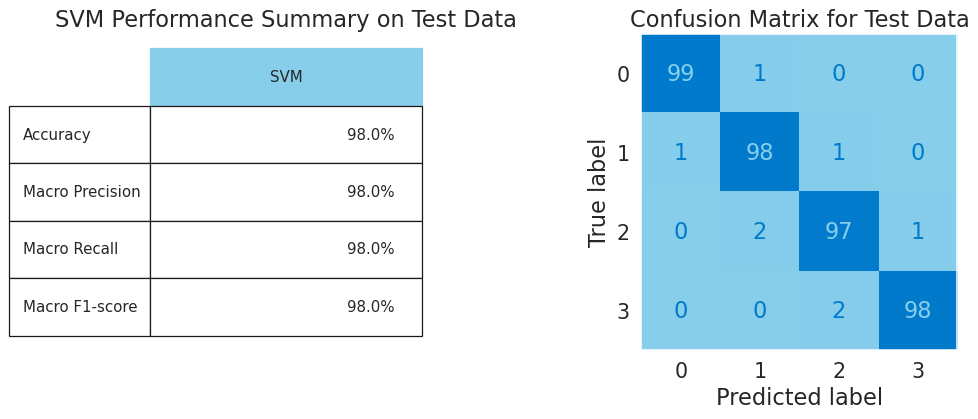

SVC(C=100, kernel='linear', probability=True, random_state=0)

In [ ]:
svm_optimized = tune_hyperparameters(svm, param_grid_svm, x_train, y_train, x_test, y_test, 'SVM')
svm_optimized

# **Logistic Regression**

In [ ]:
lr = LogisticRegression()

param_grid_logistic = {
    'penalty': ['l1', 'l2'],
    'C': [0.001, 0.01, 0.1, 1, 10, 100],
    'solver': ['liblinear', 'saga'],
    'max_iter': [100, 200, 300]
}

Best hyperparameters:
 {'C': 10, 'max_iter': 200, 'penalty': 'l1', 'solver': 'saga'}

	  Classification report for training set
-------------------------------------------------------
              precision    recall  f1-score   support

           0       0.99      1.00      0.99       400
           1       0.98      0.97      0.98       400
           2       0.98      0.97      0.97       400
           3       0.99      0.99      0.99       400

    accuracy                           0.98      1600
   macro avg       0.98      0.98      0.98      1600
weighted avg       0.98      0.98      0.98      1600


	   Classification report for test set
-------------------------------------------------------
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       100
           1       0.96      1.00      0.98       100
           2       0.98      0.95      0.96       100
           3       0.99      0.98      0.98       100

    accuracy 

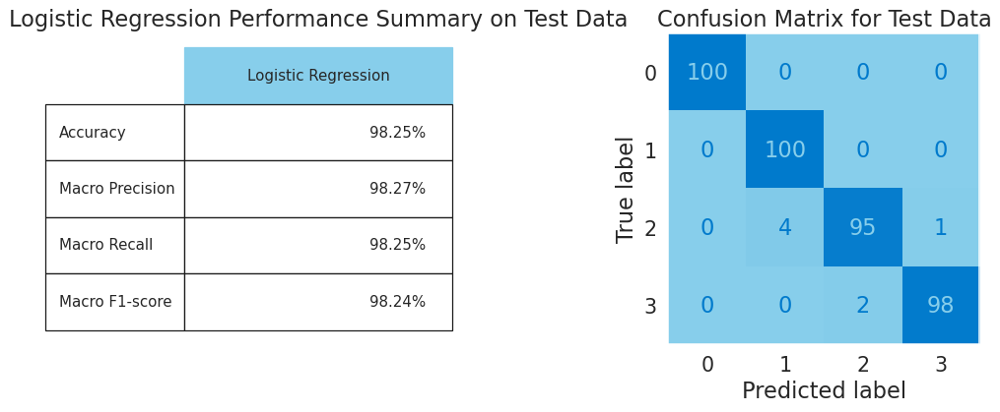

LogisticRegression(C=10, max_iter=200, penalty='l1', solver='saga')

In [ ]:
lr_optimized = tune_hyperparameters(lr, param_grid_logistic, x_train, y_train, x_test, y_test, 'Logistic Regression')
lr_optimized

# **Random Forest**

In [ ]:
rf = RandomForestClassifier()

  param_grid_rf = {
      'n_estimators': [50, 100, 200],
      'max_depth': [None, 10, 20],
      'min_samples_split': [2, 5, 10],
      'min_samples_leaf': [1, 2, 4]
  }

Best hyperparameters:
 {'max_depth': None, 'min_samples_leaf': 1, 'min_samples_split': 2, 'n_estimators': 200}

	  Classification report for training set
-------------------------------------------------------
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       400
           1       1.00      1.00      1.00       400
           2       1.00      1.00      1.00       400
           3       1.00      1.00      1.00       400

    accuracy                           1.00      1600
   macro avg       1.00      1.00      1.00      1600
weighted avg       1.00      1.00      1.00      1600


	   Classification report for test set
-------------------------------------------------------
              precision    recall  f1-score   support

           0       0.90      0.95      0.93       100
           1       0.82      0.82      0.82       100
           2       0.83      0.84      0.84       100
           3       0.97      0.91      0.9

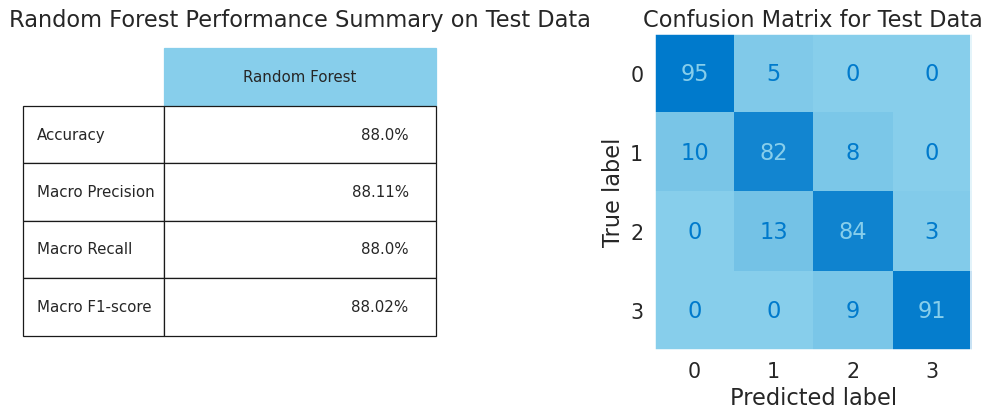

RandomForestClassifier(n_estimators=200)

In [ ]:
rf_optimized = tune_hyperparameters(rf, param_grid_rf, x_train, y_train, x_test, y_test, 'Random Forest')
rf_optimized

# **MLP**

In [ ]:
mlp = MLPClassifier()

param_grid_mlp = {
    'hidden_layer_sizes': [(50,), (100,), (50, 50), (100, 50), (150, 100)],
    'activation': ['relu', 'tanh'],
    'solver': ['adam', 'lbfgs'],
    'alpha': [0.0001, 0.001, 0.01],
    'max_iter': [100, 200, 300]
}

Best hyperparameters:
 {'activation': 'tanh', 'alpha': 0.001, 'hidden_layer_sizes': (150, 100), 'max_iter': 200, 'solver': 'lbfgs'}

	  Classification report for training set
-------------------------------------------------------
              precision    recall  f1-score   support

           0       1.00      1.00      1.00       400
           1       1.00      1.00      1.00       400
           2       1.00      1.00      1.00       400
           3       1.00      1.00      1.00       400

    accuracy                           1.00      1600
   macro avg       1.00      1.00      1.00      1600
weighted avg       1.00      1.00      1.00      1600


	   Classification report for test set
-------------------------------------------------------
              precision    recall  f1-score   support

           0       0.98      1.00      0.99       100
           1       0.98      0.97      0.97       100
           2       0.97      0.97      0.97       100
           3       0.

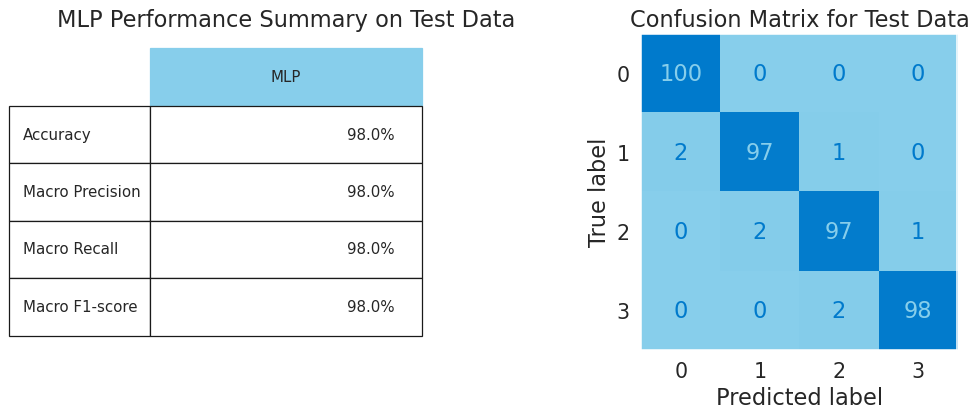

MLPClassifier(activation='tanh', alpha=0.001, hidden_layer_sizes=(150, 100),
              solver='lbfgs')

In [ ]:
mlp_optimized = tune_hyperparameters(mlp, param_grid_mlp, x_train, y_train, x_test, y_test, 'MLP')
mlp_optimized

# **Conclusions:**

We conducted exploratory data analysis (EDA), which provided us with valuable insights into our data. Subsequently, we tested these assumptions during our feature engineering process. Our findings revealed that the features with the highest mutual information scores consistently yielded the best results across various models. Following this, we fine-tuned the hyperparameters of our models to enhance accuracy. Ultimately, we achieved an impressive accuracy of 98%, which is certainly a commendable score.

The time invested in these activities included some dedicated hours over the weekend and an additional hour today (2024-01-08).